# Forecasting Residential Electricity Power Consumption

---
# Introduction

In this project, we construct algorithms to forecast residential electricity consumption with data and machine learning.

Several years ago, the University of California, Berkeley,  collected Green Button Data <http://www.greenbuttondata.org/>. This data includes hourly electricity consumption from over 20 residences in the East Bay. The data has been (mostly) cleansed for our convenience including (i) aligning time-stamps, (ii) filling-in missing data, and (iii) organizing it into an easily readable format.

In [1]:
import pandas as pd
import numpy as np
import os

from matplotlib import pyplot as plt

%matplotlib inline

---
# Loading the Data

In [2]:
train = pd.read_csv('Train_Data.csv')
train.head()

,UNIX Timestamp (seconds),"Start Time (GMT-0800,PST)","End Time (GMT-0800,PST)",Bldg1 (kWh),Bldg2 (kWh),Bldg3 (kWh),Bldg4 (kWh),Bldg5 (kWh),Bldg6 (kWh),Bldg7 (kWh),...,Bldg14 (kWh),Bldg15 (kWh),Bldg16 (kWh),Bldg17 (kWh),Bldg18 (kWh),Bldg19 (kWh),Bldg20 (kWh),Bldg21 (kWh),Bldg22 (kWh),Bldg23 (kWh)
0,1388851200,1/5/14 00:00,1/5/14 00:59,0.19,0.97,0.03,0.02,0.26,1.47,0.10,...,0.24,1.76,0.11,0.09,0.61,0.03,1.70,3.23,0.14,0.99
1,1388854800,1/5/14 01:00,1/5/14 01:59,0.19,0.83,0.10,0.02,0.26,1.48,0.20,...,0.40,1.49,0.06,0.10,0.77,0.03,1.78,2.42,0.12,0.93
2,1388858400,1/5/14 02:00,1/5/14 02:59,0.19,0.89,0.08,0.08,0.24,1.45,0.10,...,0.36,1.57,0.05,0.08,0.75,0.03,1.68,2.31,0.13,0.47
3,1388862000,1/5/14 03:00,1/5/14 03:59,0.19,0.83,0.03,0.02,0.17,1.45,0.18,...,0.33,1.31,0.06,0.13,0.34,0.02,1.70,2.72,0.14,0.58
4,1388865600,1/5/14 04:00,1/5/14 04:59,0.19,0.83,0.03,0.02,0.18,1.69,0.14,...,0.29,0.03,0.06,0.16,0.15,0.03,1.75,0.69,0.11,0.44


---
# Part I - Exploratory Data Analysis

## I. 1) Average Hourly Energy Consumption

We create a bar plot of the average hourly energy consumption [kWh] for each building. The x-axis corresponds to the building index number. The y-axis is the average hourly energy consumption. In red, we impose error bars on our bars that indicate the standard deviation of hourly energy consumption.

In [3]:
average_hourly_cons = train.mean()
std_dev = train.std()

average_hourly_cons = pd.DataFrame(average_hourly_cons[1:])
std_dev = pd.DataFrame(std_dev[1:])

average_hourly_cons = average_hourly_cons.reset_index()
std_dev = std_dev.reset_index()

average_hourly_cons.columns = ['Building index number','Average hourly Energy Consumption']
average_hourly_cons['Building index number'] = list(range(1,24))
std_dev.columns = ['Building index number','std_dev']
std_dev['Building index number'] = list(range(1,24))

average_hourly_cons = average_hourly_cons.set_index('Building index number')
std_dev = std_dev.set_index('Building index number')

average_hourly_cons.head()
std_dev.head()

,std_dev
Building index number,
1,0.059647
2,1.132069
3,0.154653
4,0.306530
5,0.073765


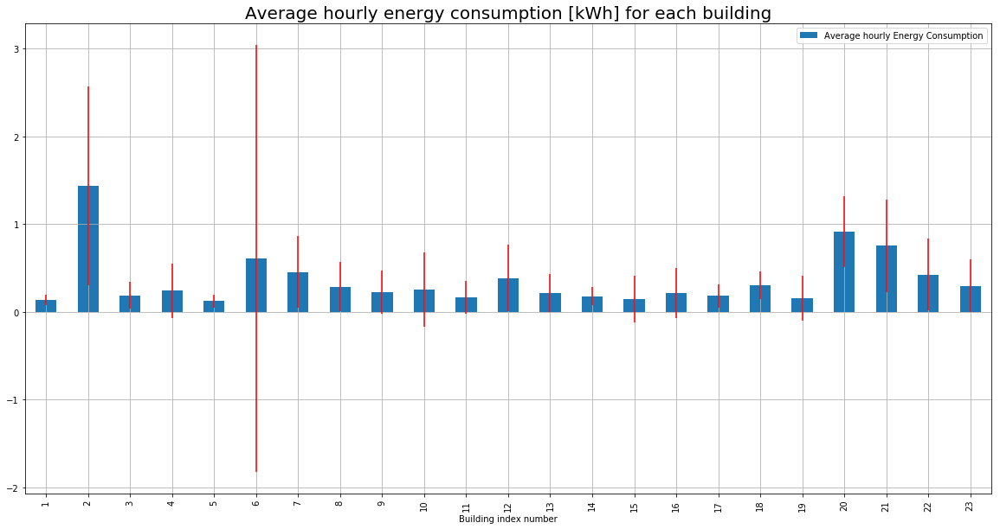

In [4]:
average_hourly_cons.plot.bar(yerr = std_dev['std_dev'], ecolor ='red', grid = True, figsize=(20,10))
plt.title('Average hourly energy consumption [kWh] for each building', size=20);

## I. 2) High Variance and Negative Power Consumption

We make sure that no building has abnormally high variance or moments of NEGATIVE power consumption. If so, then we will remove these buildings from our analysis.

In [5]:
var = train.var()
var = pd.DataFrame(var[1:])
var = var.reset_index()
var.columns = ['Buildings','Variance']
var.head()

,Buildings,Variance
0,Bldg1 (kWh),0.003558
1,Bldg2 (kWh),1.281581
2,Bldg3 (kWh),0.023918
3,Bldg4 (kWh),0.093961
4,Bldg5 (kWh),0.005441


In [6]:
print('The maximum variance is:',max(var['Variance']))
print('\nThe building with the maximum variance is:', var['Buildings'][np.argmax(var['Variance'])])

The maximum variance is: 5.923278063317463

The building with the maximum variance is: Bldg6 (kWh)


C:\Users\Elias\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:51: FutureWarning: 
The current behaviour of 'Series.argmax' is deprecated, use 'idxmax'
instead.
The behavior of 'argmax' will be corrected to return the positional
maximum in the future. For now, use 'series.values.argmax' or
'np.argmax(np.array(values))' to get the position of the maximum
row.
  return getattr(obj, method)(*args, **kwds)


In [7]:
for i in range(1,24):
    a = 'Bldg' + str(i) + ' (kWh)'
    if (train[a]<0).any():
        train = train.drop(a, axis=1)
        print('The building ' + str(i) + ' has a negative moment')

The building 6 has a negative moment


In [8]:
train.head(2)

,UNIX Timestamp (seconds),"Start Time (GMT-0800,PST)","End Time (GMT-0800,PST)",Bldg1 (kWh),Bldg2 (kWh),Bldg3 (kWh),Bldg4 (kWh),Bldg5 (kWh),Bldg7 (kWh),Bldg8 (kWh),...,Bldg14 (kWh),Bldg15 (kWh),Bldg16 (kWh),Bldg17 (kWh),Bldg18 (kWh),Bldg19 (kWh),Bldg20 (kWh),Bldg21 (kWh),Bldg22 (kWh),Bldg23 (kWh)
0,1388851200,1/5/14 00:00,1/5/14 00:59,0.19,0.97,0.03,0.02,0.26,0.1,0.10,...,0.24,1.76,0.11,0.09,0.61,0.03,1.70,3.23,0.14,0.99
1,1388854800,1/5/14 01:00,1/5/14 01:59,0.19,0.83,0.10,0.02,0.26,0.2,0.11,...,0.40,1.49,0.06,0.10,0.77,0.03,1.78,2.42,0.12,0.93


## I. 3) Energy Data 

We re-organize our energy data set into a 4-D array. In order, the dimensions correspond to:
- building index
- week-of-year
- day-of-week
- hour-of-day

For each element in the 4-D vector, we store the normalized energy. That is, divide kWh by the maximum hourly energy consumption for that building.

In [9]:
ini = min(train['UNIX Timestamp (seconds)'])
ini

1388851200

In [10]:
# Retrieve the week of the year: in one week, there is 7 * 24 * 60 * 60 = 604800 seconds 
new_csv = pd.DataFrame()
new_csv['Week of the year'] = (train['UNIX Timestamp (seconds)'] - ini) // 604800
max_week = max(new_csv['Week of the year'])
new_csv.head()

,Week of the year
0,0
1,0
2,0
3,0
4,0


In [11]:
# Retrieve the day of the week: in one day, there is 24 * 60 * 60 = 86400 seconds 
new_csv['Day of the week'] = ((train['UNIX Timestamp (seconds)'] - ini) // 86400) % 7
max_day = max(new_csv['Day of the week'])
new_csv.head()

,Week of the year,Day of the week
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [12]:
# Retrieve the hour of the day: in one hour, there is 60*60 = 3600 seconds 
new_csv['Hour of the day'] = ((train['UNIX Timestamp (seconds)'] - ini) // 3600) % 24
max_hour = max(new_csv['Hour of the day'])
new_csv.head()

,Week of the year,Day of the week,Hour of the day
0,0,0,0
1,0,0,1
2,0,0,2
3,0,0,3
4,0,0,4


In [13]:
# We make sure that we don't have any error:
print(max_week, max_day, max_hour)

50 6 23


In [14]:
L = [1,2,3,4,5,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]
for i in L:
    a = 'Bldg' + str(i) + ' (kWh)'
    new_csv[a] = train[a]
    my_max = max(new_csv[a])
    new_csv[a] = new_csv[a] / my_max
new_csv.head()

,Week of the year,Day of the week,Hour of the day,Bldg1 (kWh),Bldg2 (kWh),Bldg3 (kWh),Bldg4 (kWh),Bldg5 (kWh),Bldg7 (kWh),Bldg8 (kWh),...,Bldg14 (kWh),Bldg15 (kWh),Bldg16 (kWh),Bldg17 (kWh),Bldg18 (kWh),Bldg19 (kWh),Bldg20 (kWh),Bldg21 (kWh),Bldg22 (kWh),Bldg23 (kWh)
0,0,0,0,0.234568,0.082343,0.021277,0.006536,0.393939,0.020325,0.034014,...,0.311688,0.530120,0.037931,0.058065,0.354651,0.009524,0.478873,0.922857,0.041543,0.277311
1,0,0,1,0.234568,0.070458,0.070922,0.006536,0.393939,0.040650,0.037415,...,0.519481,0.448795,0.020690,0.064516,0.447674,0.009524,0.501408,0.691429,0.035608,0.260504
2,0,0,2,0.234568,0.075552,0.056738,0.026144,0.363636,0.020325,0.037415,...,0.467532,0.472892,0.017241,0.051613,0.436047,0.009524,0.473239,0.660000,0.038576,0.131653
3,0,0,3,0.234568,0.070458,0.021277,0.006536,0.257576,0.036585,0.037415,...,0.428571,0.394578,0.020690,0.083871,0.197674,0.006349,0.478873,0.777143,0.041543,0.162465
4,0,0,4,0.234568,0.070458,0.021277,0.006536,0.272727,0.028455,0.030612,...,0.376623,0.009036,0.020690,0.103226,0.087209,0.009524,0.492958,0.197143,0.032641,0.123249


## I. 4) Visualization

In seven separate figures (one for each day-of-week), we plot the hourly energy consumption load
shapes vs. hour (x-axis) for each building - all super-imposed.

In each of the seven figures, we plot the average hourly energy consumption in a thick black line.

In [15]:
Average_hourly_energy_consumption = pd.DataFrame()
Average_hourly_energy_consumption['Hour of the day'] = new_csv['Hour of the day'].unique()
Average_hourly_energy_consumption.head()

,Hour of the day
0,0
1,1
2,2
3,3
4,4


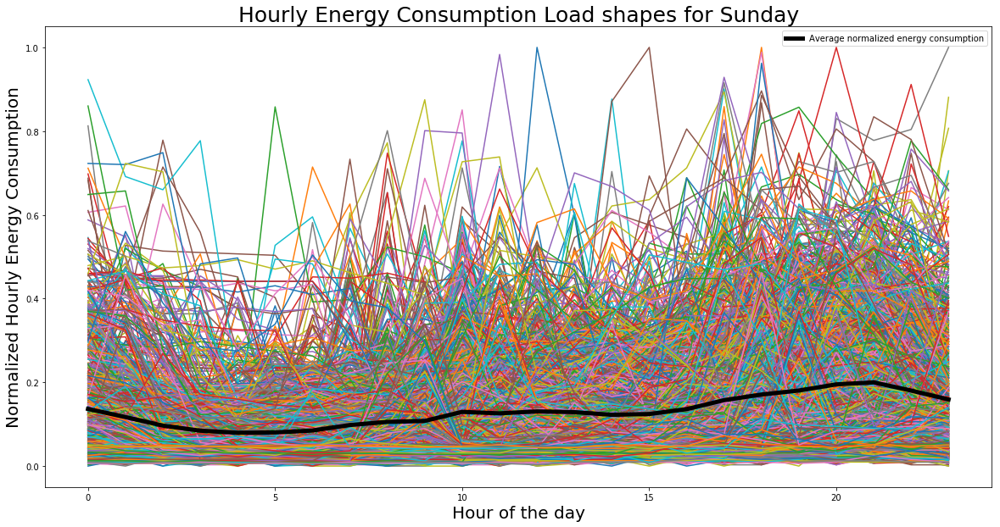

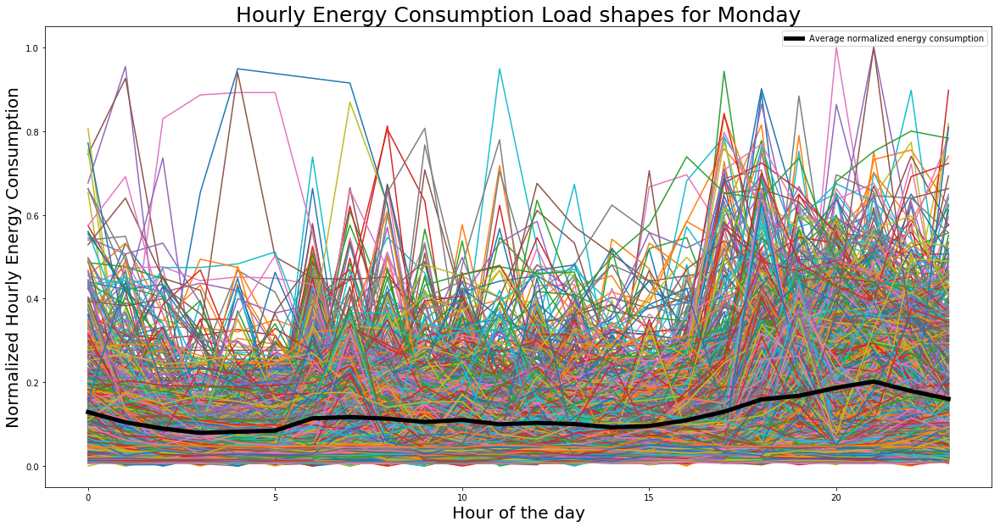

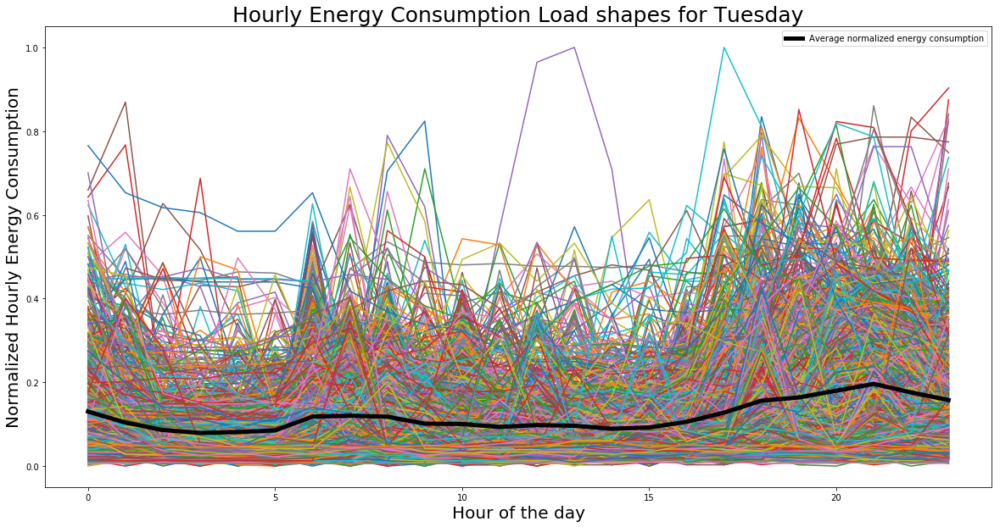

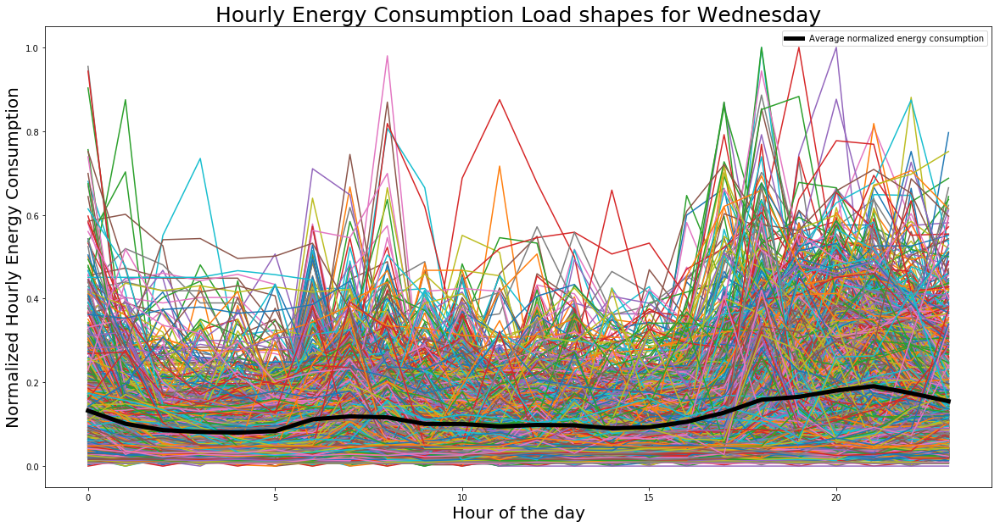

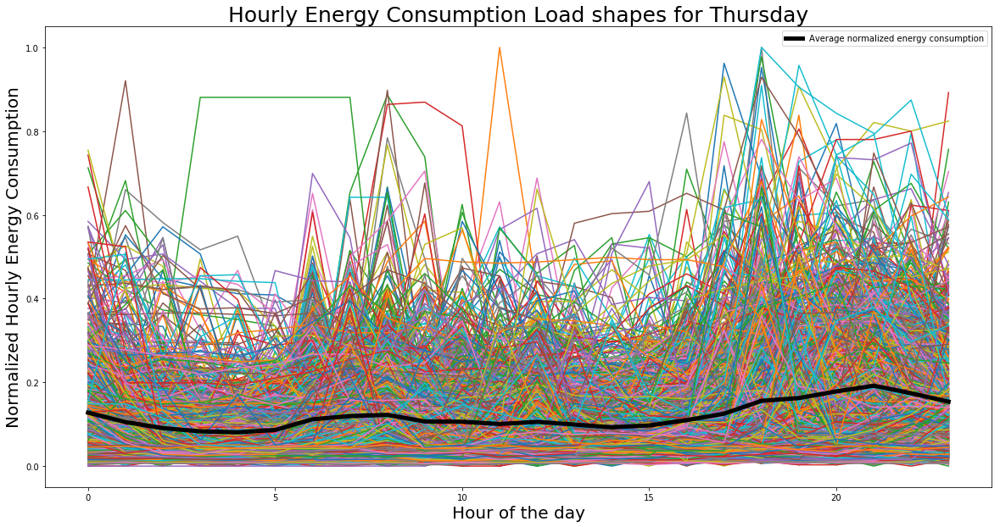

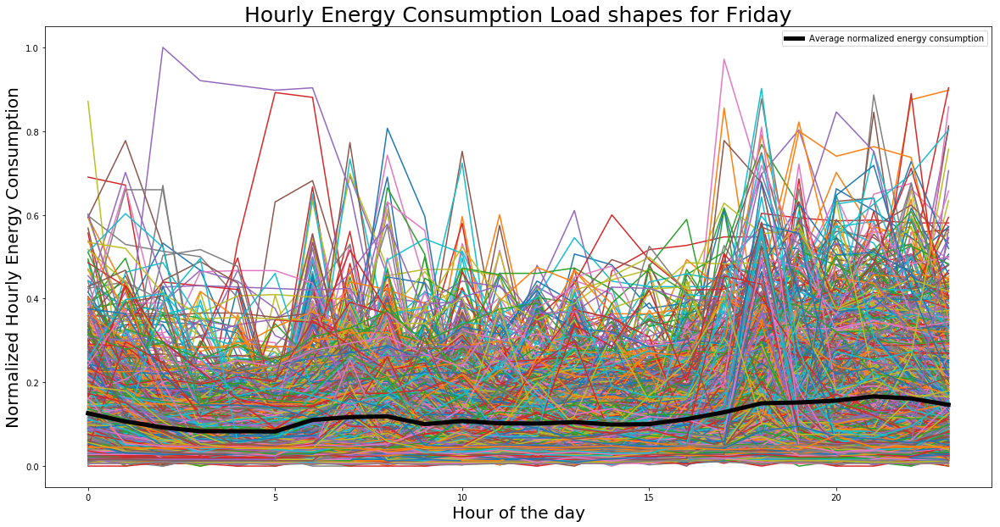

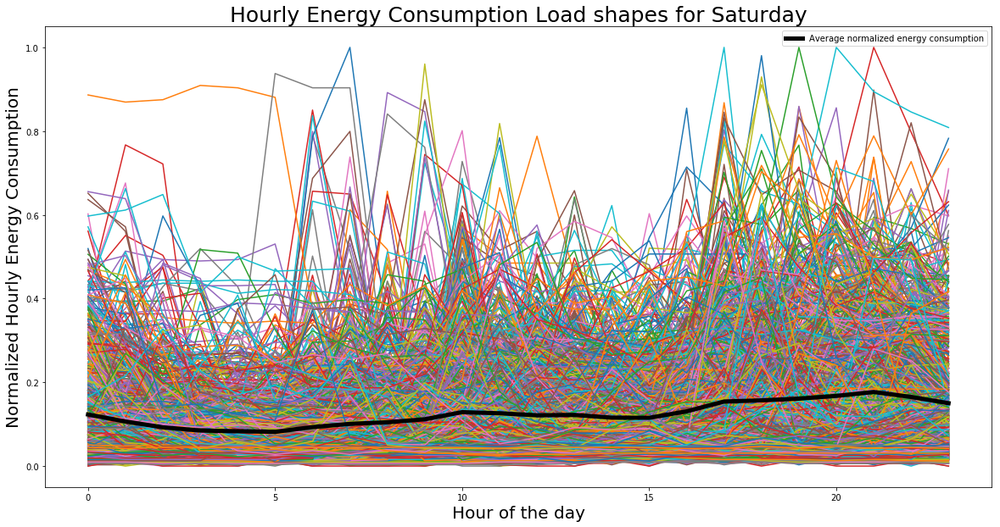

In [16]:
Days_list = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
for days in range(0,7):   #Days
    plt.figure(figsize=(20,10))
    df_1 = new_csv.loc[new_csv['Day of the week'] == days,:]
    for buildings in L:   #Buildings
        a = 'Bldg' + str(buildings) + ' (kWh)'
        df_2 = df_1.loc[:, ['Week of the year', 'Day of the week', 'Hour of the day', a] ]
        for weeks in range(0,51):   #Weeks
            df_3 = df_2.loc[ df_2['Week of the year'] == weeks,: ]
            df_3 = df_3.groupby('Hour of the day', as_index=False).mean()
            plt.plot(df_3['Hour of the day'], df_3[a], label='')
    
    # Retrieve the average normalized energy consumption
    u = df_1.drop(['Week of the year','Day of the week'], axis=1)
    v = u.groupby('Hour of the day').mean()
    w = v.mean(axis=1)
    df_4 = pd.DataFrame(w)
    df_4.columns = ['Average normalized energy consumption']
    
    # Add the result in the final dataframe
    Average_hourly_energy_consumption[ Days_list[days] ] = df_4['Average normalized energy consumption']
    
    plt.plot(df_4.index, df_4['Average normalized energy consumption'], 
             linewidth=5, color='k', label='Average normalized energy consumption')
    plt.title('Hourly Energy Consumption Load shapes for ' + Days_list[days], fontsize=25)
    plt.legend()
    plt.xlabel('Hour of the day', fontsize=20)
    plt.ylabel('Normalized Hourly Energy Consumption', fontsize=20)
    plt.show()

In [17]:
Average_hourly_energy_consumption

,Hour of the day,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday
0,0,0.136458,0.128927,0.130375,0.132244,0.127630,0.126196,0.123154
1,1,0.117043,0.104638,0.103968,0.101125,0.105139,0.106543,0.106463
2,2,0.096639,0.089523,0.086131,0.085965,0.090625,0.092179,0.092514
3,3,0.084526,0.079197,0.079048,0.081402,0.082978,0.083211,0.084823
4,4,0.079652,0.082080,0.081323,0.080146,0.080776,0.083178,0.083240
5,5,0.080324,0.084581,0.085346,0.083581,0.086234,0.082723,0.081810
6,6,0.084918,0.114125,0.118119,0.111552,0.111813,0.110232,0.093106
7,7,0.098059,0.117018,0.120261,0.118613,0.119405,0.116959,0.100800
8,8,0.105525,0.113143,0.117981,0.116302,0.122299,0.118587,0.104643
9,9,0.107880,0.105384,0.101296,0.100592,0.106529,0.100025,0.111793


---
# Part II - Average Model

In this part, we design an extremely simple forecasting model that is often effective. We call it the “Average Model”. The average model forecasts the building power to be the average value from historical data at the HoD (Hour of the Day) and DoW (Day of the Week). Mathematically:

<img src = 'Figure1.jpg'>

where:
- P € R(7x24) is the average value from historical data, for each (DoW, HoD) pair.
- U(k) € {0, 1}^(7x24). All elements are zero, except the one element which corresponds to (DoW,HoD) at time step k. For example,
    - if k corresponds to 12am on Sunday, then U1,1(k) = 1.
    - if k corresponds to 3am on Monday, then U2,4(k) = 1.
    - if k corresponds to 11pm on Saturday, then U7,23(k) = 1.

## II. 1) Normalized Hourly Energy

We load the test data file Test_Data.csv. The test data includes one week of normalized hourly load for Sunday Sept 7, 2014 00:00 – Saturday Sept 13, 2014 23:00. We generate seven plots (one for each DoW) which visualize HoD (x-axis) and the normalized hourly energy for the Test Data and Average Model.

In [18]:
#Import the file
my_csv_test = pd.read_excel('Test_Data.xlsx', parse_dates=['TestTime'])
my_csv_test.head()

,TestTime,TestBldg
0,2014-09-07 00:00:00,0.094276
1,2014-09-07 01:00:00,0.037037
2,2014-09-07 02:00:00,0.040404
3,2014-09-07 03:00:00,0.037037
4,2014-09-07 04:00:00,0.037037


In [19]:
# Retrieve the hour of the test
my_csv_test['Hour'] = (my_csv_test['TestTime']).apply(lambda x: int(str(x)[11:13]))
my_csv_test.head()

,TestTime,TestBldg,Hour
0,2014-09-07 00:00:00,0.094276,0
1,2014-09-07 01:00:00,0.037037,1
2,2014-09-07 02:00:00,0.040404,2
3,2014-09-07 03:00:00,0.037037,3
4,2014-09-07 04:00:00,0.037037,4


In [20]:
# Retrieve the day of the test
my_csv_test['Day'] = (my_csv_test['TestTime']).apply(lambda x: x.day_name())
my_csv_test.head()

,TestTime,TestBldg,Hour,Day
0,2014-09-07 00:00:00,0.094276,0,Sunday
1,2014-09-07 01:00:00,0.037037,1,Sunday
2,2014-09-07 02:00:00,0.040404,2,Sunday
3,2014-09-07 03:00:00,0.037037,3,Sunday
4,2014-09-07 04:00:00,0.037037,4,Sunday


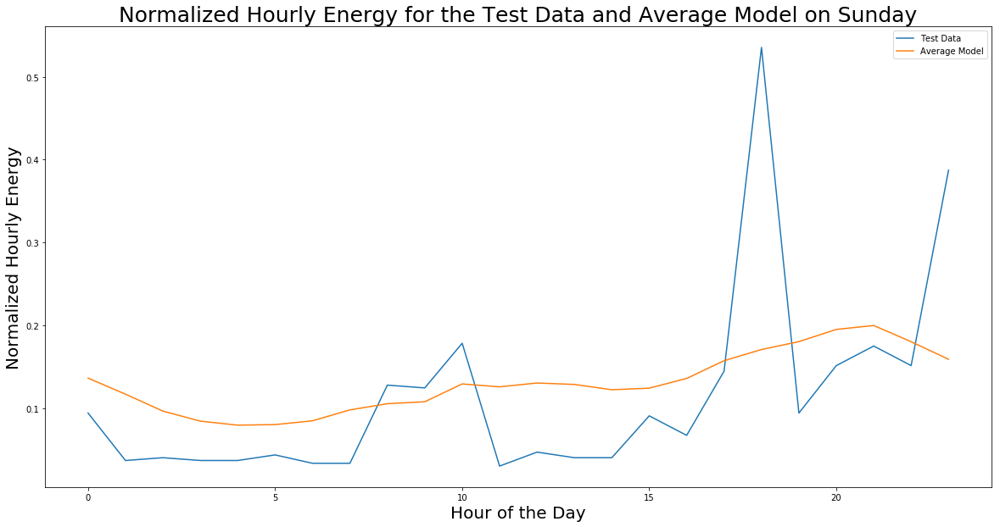

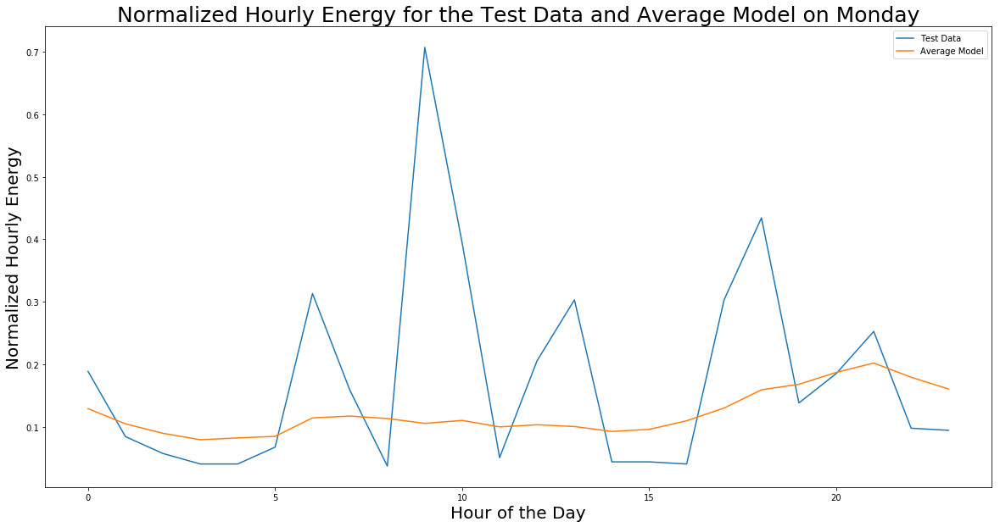

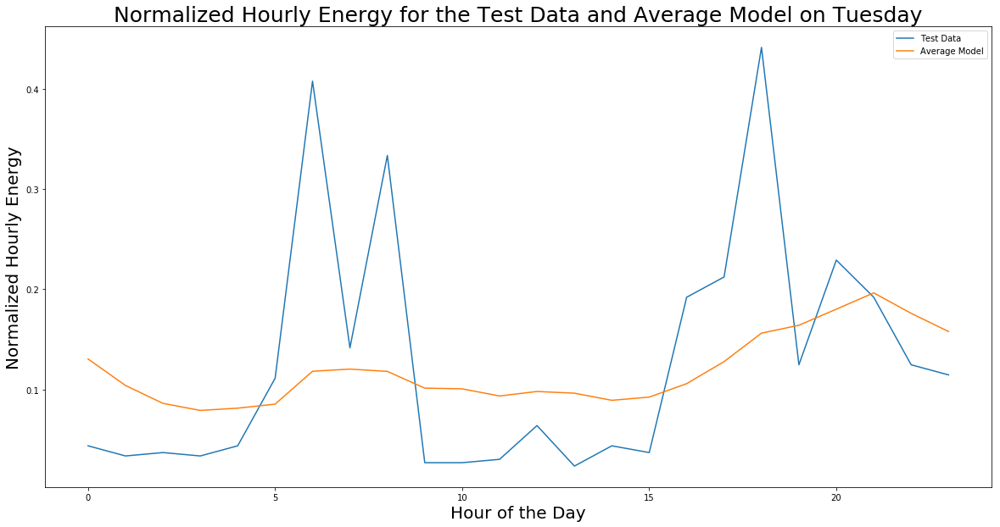

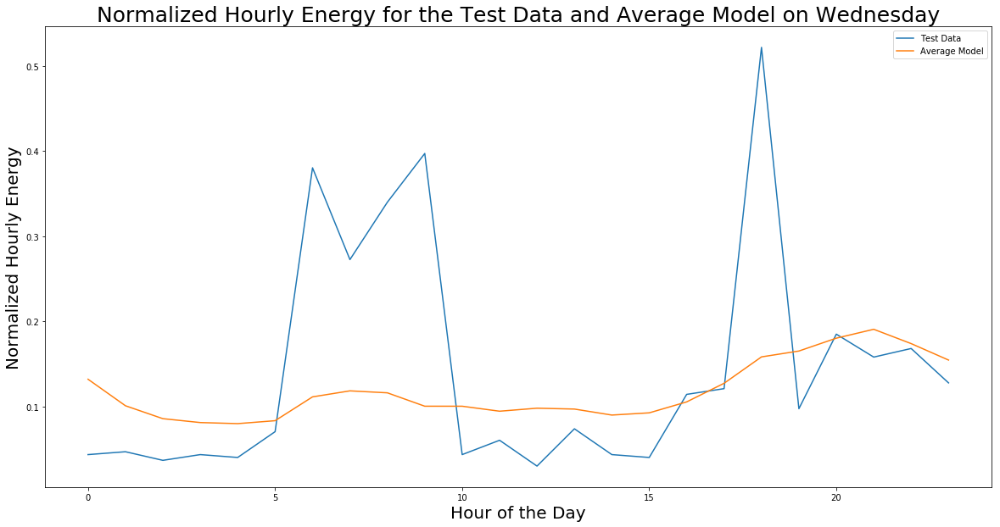

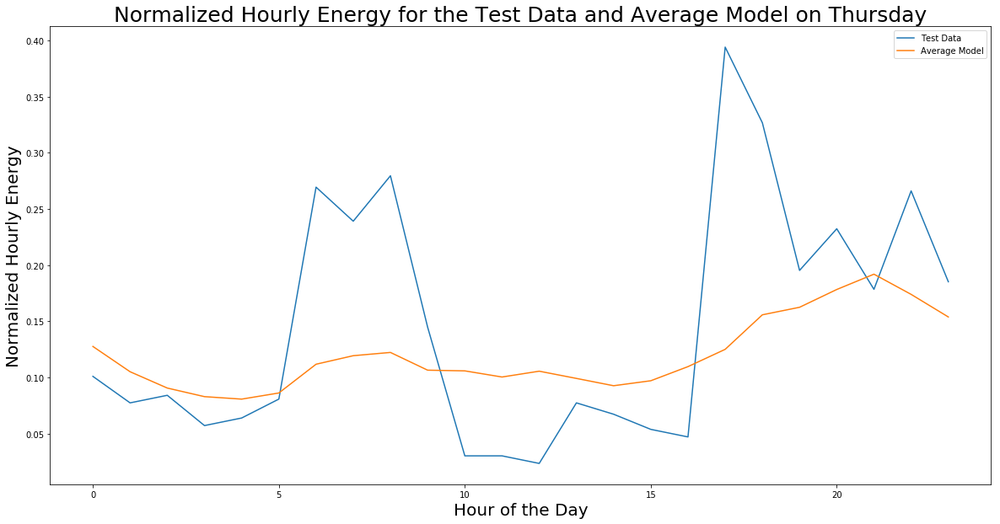

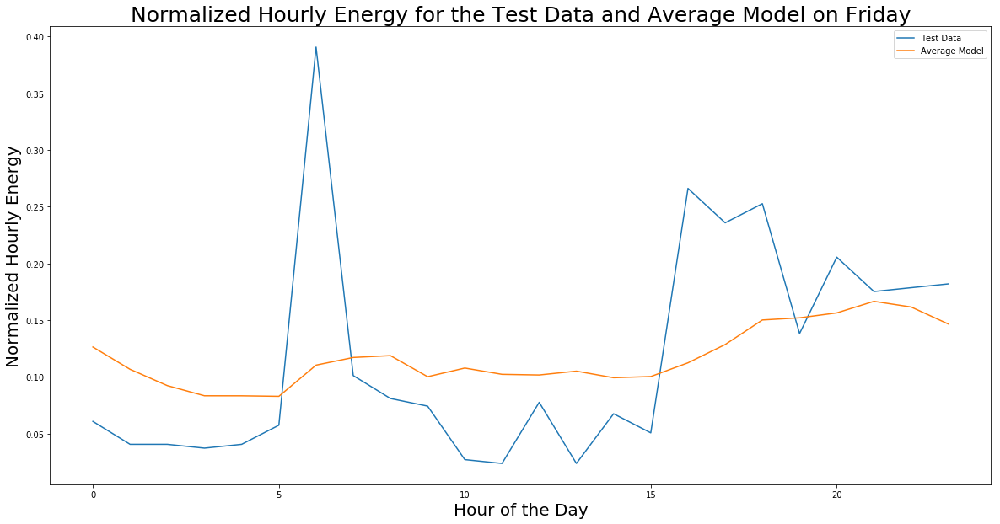

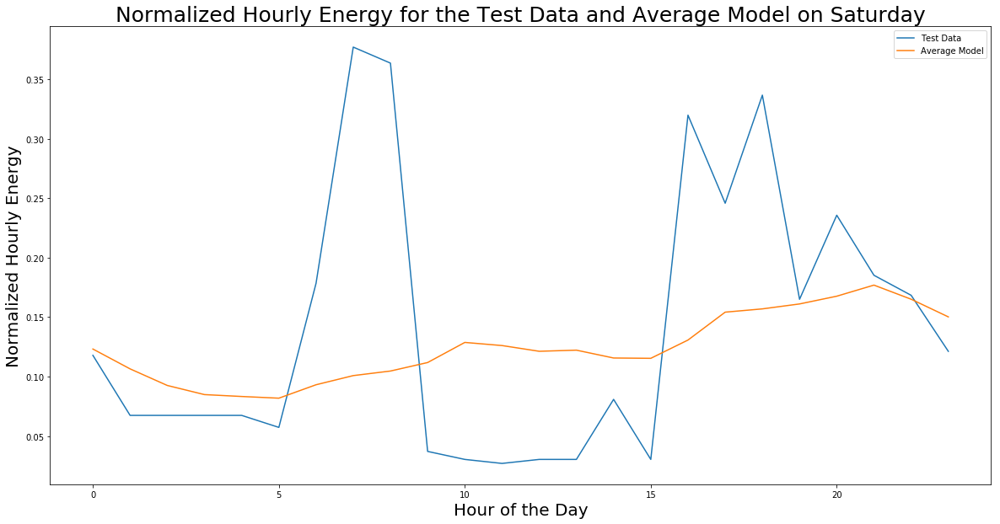

In [21]:
AVG_MAE = []
Days_list = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

for days in range(0,7):
    s = 0
    for hour in range(0,24):
        u = new_csv.loc[(new_csv['Hour of the day'] == hour) & (new_csv['Day of the week'] == days),:]
        v = u.drop(['Week of the year', 'Day of the week', 'Hour of the day'], axis=1)
        w = v.mean()
        w = pd.DataFrame(w)
        x = w.mean()
        P_hat = x[0]
        P = float(my_csv_test.loc[(my_csv_test['Hour'] == hour) & (my_csv_test['Day'] == Days_list[days]), 'TestBldg'])
        s = s + abs(P - P_hat)
    s = s/24
    AVG_MAE.append(s)
    
    #Plot the results
    df_1 = my_csv_test.loc[ my_csv_test['Day'] == Days_list[days], : ]
    average_of_the_day = Average_hourly_energy_consumption[Days_list[days]]
    
    plt.figure(figsize=(20,10))
    plt.plot(df_1['Hour'].tolist(), df_1['TestBldg'].tolist(), label='Test Data')
    plt.plot(df_1['Hour'].tolist(), average_of_the_day.tolist(), label='Average Model')
    plt.xlabel('Hour of the Day', fontsize=20)
    plt.ylabel('Normalized Hourly Energy', fontsize=20)
    plt.legend()
    plt.title('Normalized Hourly Energy for the Test Data and Average Model on ' + Days_list[days], fontsize=25)
    plt.show()

## II. 2) Mean Absolute Error

For each DoW and the entire week, we compute the mean absolute error:

<img src='Figure2.jpg'>

In [22]:
Results = pd.DataFrame()
Results['Day'] = Days_list
Results['Avg MAE'] = AVG_MAE
Results

,Day,Avg MAE
0,Sunday,0.072869
1,Monday,0.108930
2,Tuesday,0.079239
3,Wednesday,0.084258
4,Thursday,0.067724
5,Friday,0.062153
6,Saturday,0.079013


In [23]:
print('The day that has the smallest AVG MAE is: ', Results.loc[ np.argmin(Results['Avg MAE']), 'Day'] )
print('The corresponding AVG MAE is: ', np.min(Results['Avg MAE']))

The day that has the smallest AVG MAE is:  Friday
The corresponding AVG MAE is:  0.06215276242940835


C:\Users\Elias\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:51: FutureWarning: 
The current behaviour of 'Series.argmin' is deprecated, use 'idxmin'
instead.
The behavior of 'argmin' will be corrected to return the positional
minimum in the future. For now, use 'series.values.argmin' or
'np.argmin(np.array(values))' to get the position of the minimum
row.
  return getattr(obj, method)(*args, **kwds)


In [24]:
print('The day that has the largest AVG MAE is: ', Results.loc[ np.argmax(Results['Avg MAE']), 'Day'] )
print('The corresponding AVG MAE is: ', np.max(Results['Avg MAE']))

The day that has the largest AVG MAE is:  Monday
The corresponding AVG MAE is:  0.10893021905896483


---
# Part III - Autoregressive with eXogeneous Inputs Model (ARX)

In this part, we will design a forecasting model based on the Autoregressive with eXogenous inputs model (ARX). We consider the ARX model given by:

<img src='Figure3.jpg'>

where ^P(k) is the normalized hourly energy consumption we aim to forecast in the target hour. The inputs include the previous hourly energy consumption: P(k-1), P(k-2), ..., P(k-L). We will also consider an exogenous term corresponding to the average power: ^Pavg(k). Consequently, the autoregressive terms adjust the average model based upon temporally local power, over a short retrospective horizon. In total, we must fit L parameters.

## III. 1) Linear Form

The ARX model in linear-in-the-parameters form is given by:

<img src='Figure4.jpg'>



## III. 2) Least Squares Optimization

The least squares optimization problem is given by:

<img src='Figure5.jpg'>

## III. 3) Case L = 3

Let's solve our optimization problem with L = 3

We want the values of alpha_1, alpha_2, alpha_3.

In [25]:
new_csv_group = new_csv.groupby(['Week of the year', 'Day of the week', 'Hour of the day'], as_index=False).mean()
new_csv_group.head()

,Week of the year,Day of the week,Hour of the day,Bldg1 (kWh),Bldg2 (kWh),Bldg3 (kWh),Bldg4 (kWh),Bldg5 (kWh),Bldg7 (kWh),Bldg8 (kWh),...,Bldg14 (kWh),Bldg15 (kWh),Bldg16 (kWh),Bldg17 (kWh),Bldg18 (kWh),Bldg19 (kWh),Bldg20 (kWh),Bldg21 (kWh),Bldg22 (kWh),Bldg23 (kWh)
0,0,0,0,0.234568,0.082343,0.021277,0.006536,0.393939,0.020325,0.034014,...,0.311688,0.530120,0.037931,0.058065,0.354651,0.009524,0.478873,0.922857,0.041543,0.277311
1,0,0,1,0.234568,0.070458,0.070922,0.006536,0.393939,0.040650,0.037415,...,0.519481,0.448795,0.020690,0.064516,0.447674,0.009524,0.501408,0.691429,0.035608,0.260504
2,0,0,2,0.234568,0.075552,0.056738,0.026144,0.363636,0.020325,0.037415,...,0.467532,0.472892,0.017241,0.051613,0.436047,0.009524,0.473239,0.660000,0.038576,0.131653
3,0,0,3,0.234568,0.070458,0.021277,0.006536,0.257576,0.036585,0.037415,...,0.428571,0.394578,0.020690,0.083871,0.197674,0.006349,0.478873,0.777143,0.041543,0.162465
4,0,0,4,0.234568,0.070458,0.021277,0.006536,0.272727,0.028455,0.030612,...,0.376623,0.009036,0.020690,0.103226,0.087209,0.009524,0.492958,0.197143,0.032641,0.123249


In [26]:
mean_col = new_csv_group.drop(['Week of the year', 'Day of the week', 'Hour of the day'], axis=1)
mean_col = mean_col.mean(axis=1)
mean_col.head()

0    0.184008
1    0.182810
2    0.170045
3    0.155630
4    0.104664
dtype: float64

In [27]:
new_csv_group_2 = pd.DataFrame()
new_csv_group_2['Week of the year'] = new_csv_group['Week of the year']
new_csv_group_2['Day of the week'] = new_csv_group['Day of the week']
new_csv_group_2['Hour of the day'] = new_csv_group['Hour of the day']
new_csv_group_2['Mean_Normalized_Energy'] = mean_col.to_list()
new_csv_group_2.head()

,Week of the year,Day of the week,Hour of the day,Mean_Normalized_Energy
0,0,0,0,0.184008
1,0,0,1,0.182810
2,0,0,2,0.170045
3,0,0,3,0.155630
4,0,0,4,0.104664


In [28]:
Days_list = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

def average_position(x,y):
    x = int(x)
    y = int(y)
    alpha = str(Days_list[y])
    return Average_hourly_energy_consumption.loc[x,alpha]

In [29]:
new_csv_group_2['Average Power'] = new_csv_group_2.apply(lambda x: average_position(x['Hour of the day'],x['Day of the week']) , axis = 1)
new_csv_group_2.head()

,Week of the year,Day of the week,Hour of the day,Mean_Normalized_Energy,Average Power
0,0,0,0,0.184008,0.136458
1,0,0,1,0.182810,0.117043
2,0,0,2,0.170045,0.096639
3,0,0,3,0.155630,0.084526
4,0,0,4,0.104664,0.079652


In [30]:
new_csv_group_2['Y'] = new_csv_group_2['Mean_Normalized_Energy'] - new_csv_group_2['Average Power']
new_csv_group_2.head()

,Week of the year,Day of the week,Hour of the day,Mean_Normalized_Energy,Average Power,Y
0,0,0,0,0.184008,0.136458,0.047550
1,0,0,1,0.182810,0.117043,0.065767
2,0,0,2,0.170045,0.096639,0.073406
3,0,0,3,0.155630,0.084526,0.071104
4,0,0,4,0.104664,0.079652,0.025012


In [31]:
new_csv_group_2['alpha_1'] = new_csv_group_2.Mean_Normalized_Energy.shift(1)
new_csv_group_2['alpha_2'] = new_csv_group_2.Mean_Normalized_Energy.shift(2)
new_csv_group_2['alpha_3'] = new_csv_group_2.Mean_Normalized_Energy.shift(3)
new_csv_group_2.head()

,Week of the year,Day of the week,Hour of the day,Mean_Normalized_Energy,Average Power,Y,alpha_1,alpha_2,alpha_3
0,0,0,0,0.184008,0.136458,0.047550,NaN,NaN,NaN
1,0,0,1,0.182810,0.117043,0.065767,0.184008,NaN,NaN
2,0,0,2,0.170045,0.096639,0.073406,0.182810,0.184008,NaN
3,0,0,3,0.155630,0.084526,0.071104,0.170045,0.182810,0.184008
4,0,0,4,0.104664,0.079652,0.025012,0.155630,0.170045,0.182810


In [32]:
new_csv_group_2 = new_csv_group_2.dropna()
new_csv_group_2.head()

,Week of the year,Day of the week,Hour of the day,Mean_Normalized_Energy,Average Power,Y,alpha_1,alpha_2,alpha_3
3,0,0,3,0.155630,0.084526,0.071104,0.170045,0.182810,0.184008
4,0,0,4,0.104664,0.079652,0.025012,0.155630,0.170045,0.182810
5,0,0,5,0.110954,0.080324,0.030630,0.104664,0.155630,0.170045
6,0,0,6,0.148588,0.084918,0.063670,0.110954,0.104664,0.155630
7,0,0,7,0.111328,0.098059,0.013269,0.148588,0.110954,0.104664


In [33]:
Y = np.array(new_csv_group_2['Y'].tolist())
Y

array([ 0.07110429,  0.02501239,  0.03062955, ..., -0.04109634,
       -0.05239995, -0.0479551 ])

In [34]:
new_csv_group_2['Phi'] = new_csv_group_2.apply(lambda x: [x['alpha_1'], x['alpha_2'], x['alpha_3']], axis = 1)
new_csv_group_2.head()

,Week of the year,Day of the week,Hour of the day,Mean_Normalized_Energy,Average Power,Y,alpha_1,alpha_2,alpha_3,Phi
3,0,0,3,0.155630,0.084526,0.071104,0.170045,0.182810,0.184008,"[0.17004508647375915, 0.18281003849304048, 0.1..."
4,0,0,4,0.104664,0.079652,0.025012,0.155630,0.170045,0.182810,"[0.1556301935803614, 0.17004508647375915, 0.18..."
5,0,0,5,0.110954,0.080324,0.030630,0.104664,0.155630,0.170045,"[0.10466389893073842, 0.1556301935803614, 0.17..."
6,0,0,6,0.148588,0.084918,0.063670,0.110954,0.104664,0.155630,"[0.11095392654296045, 0.10466389893073842, 0.1..."
7,0,0,7,0.111328,0.098059,0.013269,0.148588,0.110954,0.104664,"[0.14858832083039092, 0.11095392654296045, 0.1..."


In [35]:
Phi = np.array(new_csv_group_2['Phi'].tolist())
Phi

array([[0.17004509, 0.18281004, 0.18400765],
       [0.15563019, 0.17004509, 0.18281004],
       [0.1046639 , 0.15563019, 0.17004509],
       ...,
       [0.17564474, 0.11982574, 0.10975776],
       [0.13582113, 0.17564474, 0.11982574],
       [0.11264925, 0.13582113, 0.17564474]])

In [36]:
Alpha = np.dot(np.dot(np.linalg.inv(np.dot(Phi.T, Phi)), Phi.T), Y)

In [37]:
print('alpha_1 = ', Alpha[0])
print('alpha_2 = ', Alpha[1])
print('alpha_3 = ', Alpha[2])

alpha_1 =  0.16369596035643197
alpha_2 =  -0.08752300847726993
alpha_3 =  -0.056505031513438164


## III. 4) Visualization

We test our ARX model on the test data set. We generate seven plots (one for each DoW) which visualize HoD (x-axis) and the normalized hourly energy for the Test Data, the Average Model, and the ARX model. We report the MAE for each DoW, and the entire week.

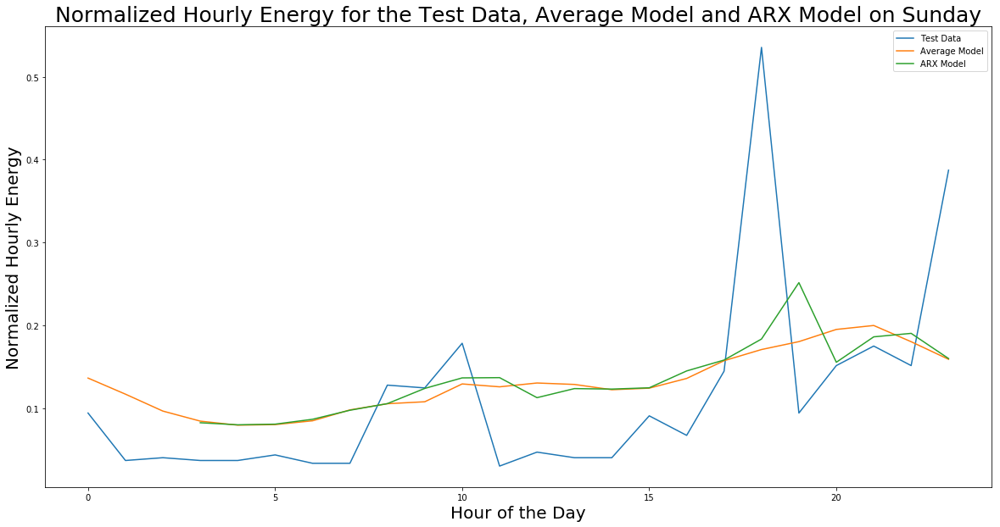

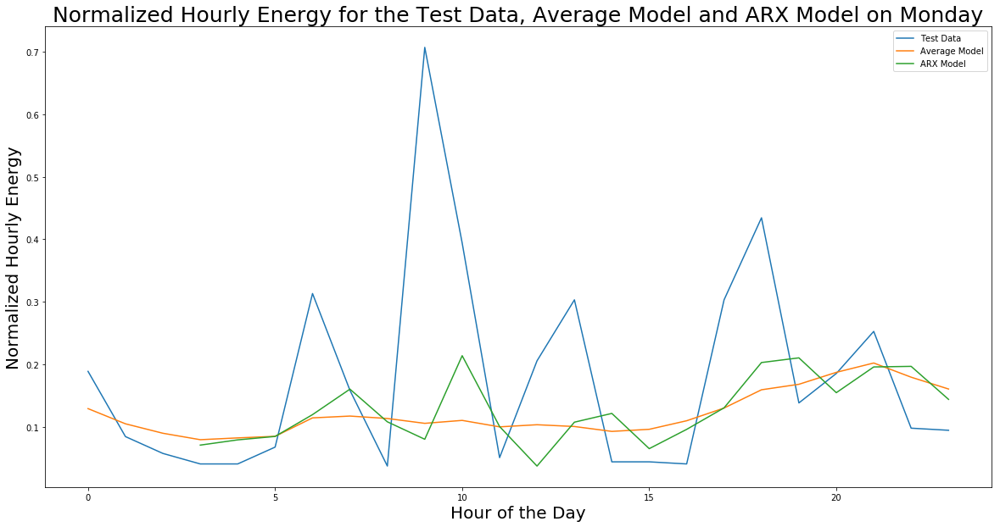

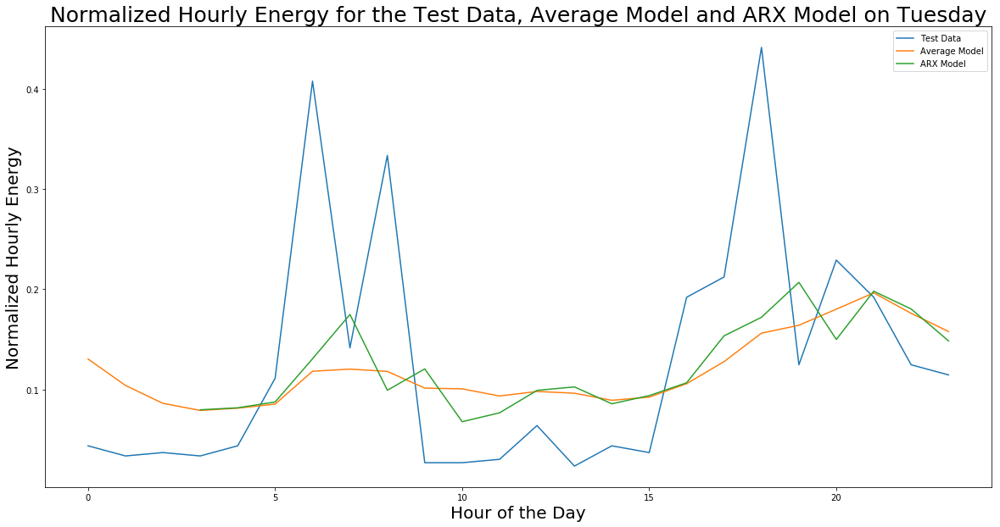

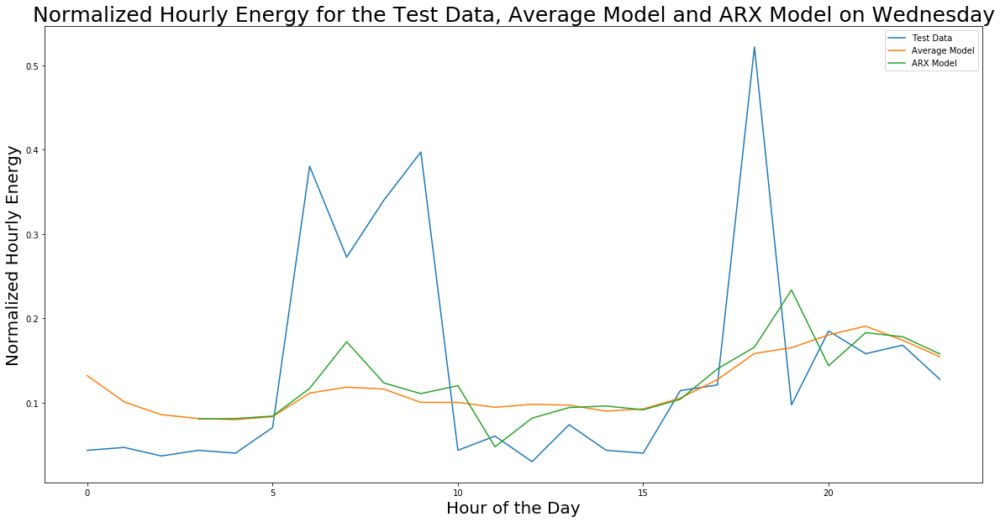

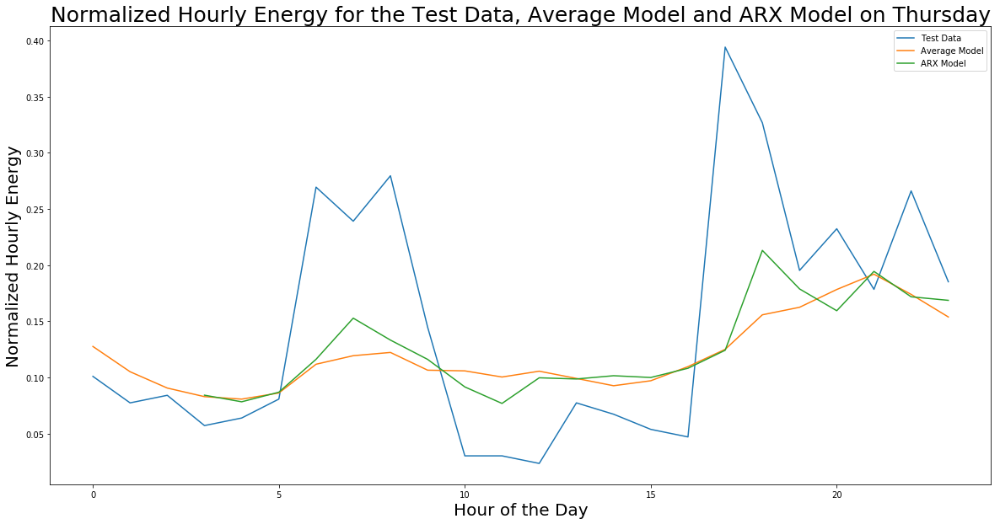

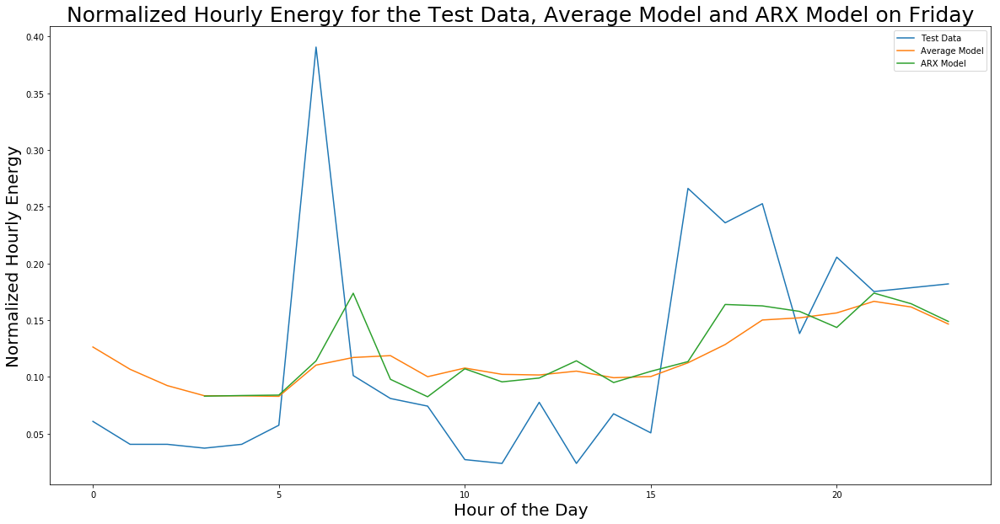

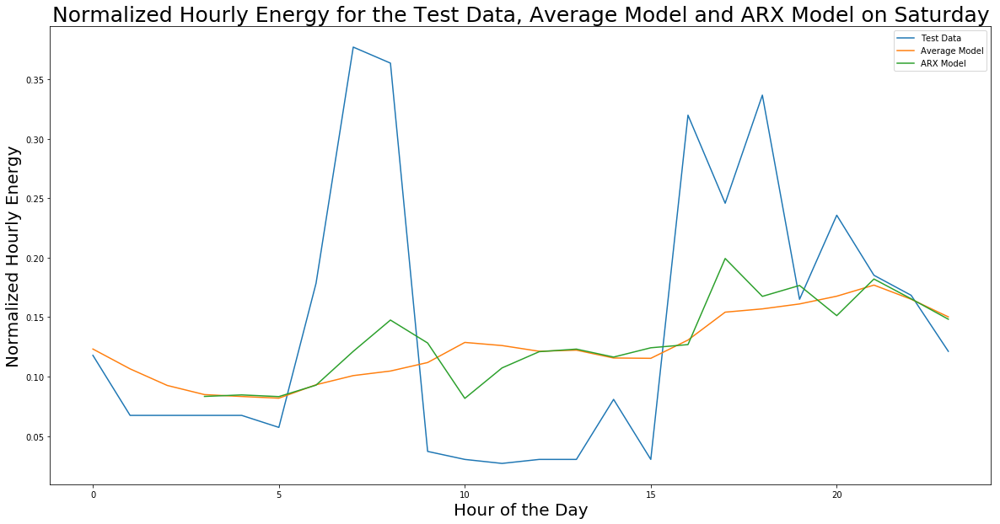

In [38]:
Days_list = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

ARX_MAE = []

for days in range(0,7):
    alpha = Days_list[days]
    df_1 = my_csv_test[ my_csv_test['Day'] == alpha]
    average = Average_hourly_energy_consumption[alpha].to_list()
    L = []
    s = 0
    for hours in range(0,24):
        if hours >= 3:
            P1 = float(my_csv_test.loc[(my_csv_test['Hour'] == hours-1) & 
                                   (my_csv_test['Day'] == alpha), 'TestBldg'])
            P2 = float(my_csv_test.loc[(my_csv_test['Hour'] == hours-2) & 
                                   (my_csv_test['Day'] == alpha), 'TestBldg'])
            P3 = float(my_csv_test.loc[(my_csv_test['Hour'] == hours-3) & 
                                       (my_csv_test['Day'] == alpha), 'TestBldg'])
            P = float(my_csv_test.loc[(my_csv_test['Hour'] == hours) & 
                                      (my_csv_test['Day'] == alpha), 'TestBldg'])
            a = Alpha[0]*P1 + Alpha[1]*P2 + Alpha[2]*P3 + average[hours]
            L.append(a)
            s = s + abs(P-a)
    s = s/24
    ARX_MAE.append(s)
        
    #Plot
    plt.figure(figsize=(20,10))
    plt.plot(df_1['Hour'].tolist(), df_1['TestBldg'].tolist(), label = 'Test Data')
    plt.plot(df_1['Hour'].tolist(), average, label='Average Model')
    plt.plot(df_1['Hour'].tolist()[3:24], L, label='ARX Model')
    plt.xlabel('Hour of the Day', fontsize=20)
    plt.ylabel('Normalized Hourly Energy', fontsize=20)
    plt.legend()
    plt.title('Normalized Hourly Energy for the Test Data, Average Model and ARX Model on ' + alpha, fontsize=25)
    plt.show()

In [39]:
Results['ARX MAE'] = ARX_MAE
Results

,Day,Avg MAE,ARX MAE
0,Sunday,0.072869,0.065047
1,Monday,0.108930,0.101673
2,Tuesday,0.079239,0.071474
3,Wednesday,0.084258,0.077112
4,Thursday,0.067724,0.058664
5,Friday,0.062153,0.053341
6,Saturday,0.079013,0.070433


---
# Part IV - Neural Network Model

Next, we consider a neural network (NN) model, and more specifically a single neuron model. As detailed below, the NN model is just a nonlinear function with many parameters (a.k.a. “weights” in the jargon of ML). Our NN model is simply: 

^Pnn(k) = fnn(x; theta)+ ^Pavg(k) where the NN makes adjustments to the power forecast relative to the mean.

<img src='Figure6.jpg'>

## IV. 1) Least Squares Problem

Consider the least squares error:

<img src='Figure7.jpg'>

Our objective is to fit neural network weights w to the example training data,

<img src='Figure8.jpg'>

where training example index (i) = 1, 2, ..., m corresponds to time index k = 4, 5, ...,K. We do this by solving a nonlinear least squares optimization problem:

<img src='Figure9.jpg'>

which is a nonlinear program because the output y is nonlinear w.r.t. weights w.

## IV. 2) Gradient Descent

A simple fitting/optimization algorithm is called “gradient descent”:

<img src='Figure10.jpg'>

where superscript (.)^k represents the iterations. Armed with the gradient descent method, our next goal is to compute the gradient in the formula above. We use chain rule to expand dJ/dw.

The gradient term can be expanded via chain rule as follows:

<img src='Figure11.jpg'>

Substituting these expressions into the gradient descent algorithm yields the formulate specific to our problem:

<img src='Figure12.jpg'>

## IV. 3) Implementation

We implement the gradient descent algorithm. We select an initial guess of w^0 = 0 € R^3. We use a small step size/learning rate, such as gamma = 0.01. We perform at least three steps of gradient descent.

In [40]:
W = np.array([0,0,0])
i = 0
d = 1
gamma = 0.01

while d >= 10**(-100):
    new_W = np.array([])
    for k1 in range(0,3):
        su = 0
        for k2 in range(0, len( df_1['TestBldg'].tolist() )):
            y, ph = Y[k2], Phi[k2].T
            su += Y[k2] - np.tanh(np.dot(W, ph)) + (1-(np.tanh(np.dot(W, ph))**2))*ph[k1]
        a = W[0] + gamma * su
        new_W = np.append(new_W,a)
    d = new_W-W
    d = np.sum(d)
    d = d/3
    W = new_W
    i = i+1

print('Number of steps: ', i)
print('w_1 = ', W[0])
print('w_2 = ', W[1])
print('w_3 = ', W[2])

Number of steps:  292
w_1 =  0.35753486569448806
w_2 =  0.35838575070866263
w_3 =  0.3589727089345332


## IV. 4) Visualization

We test your NN model on the test data set. We generate seven plots (one for each DoW) which visualize HoD (x-axis) and the normalized hourly energy for the Test Data, the Average Model, the ARX model, and the NN model. We report the MAE for each DoW, and the entire week.

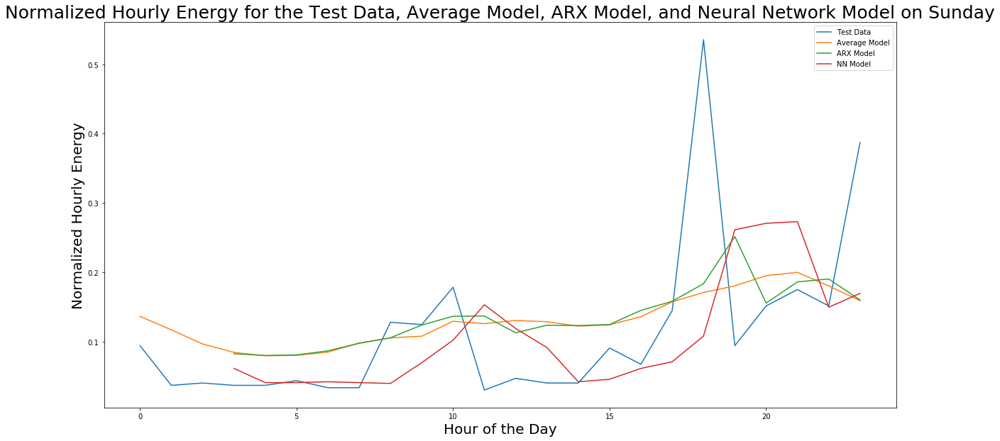

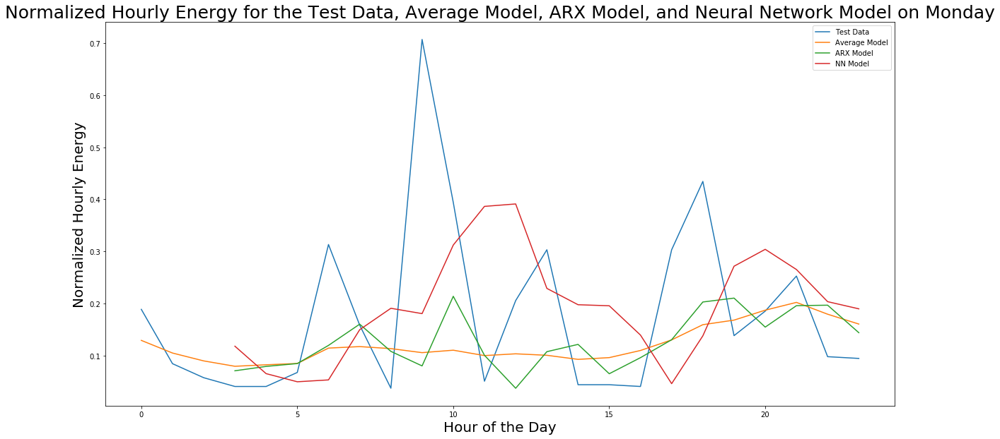

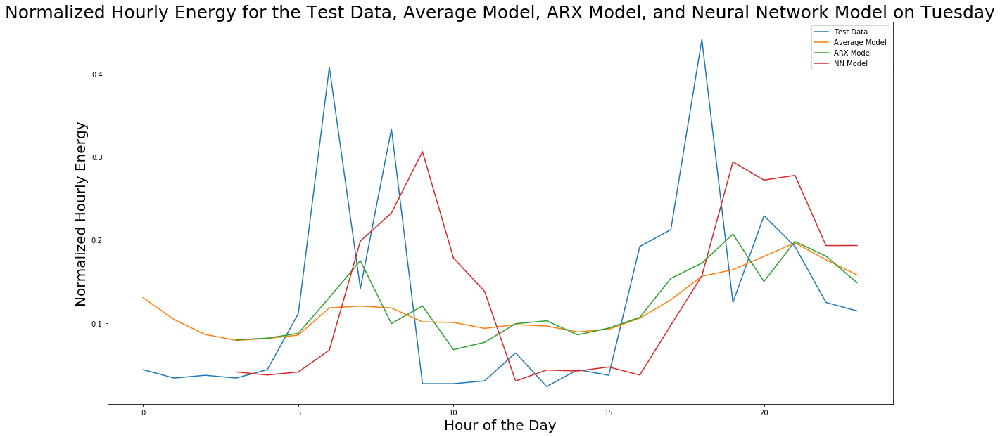

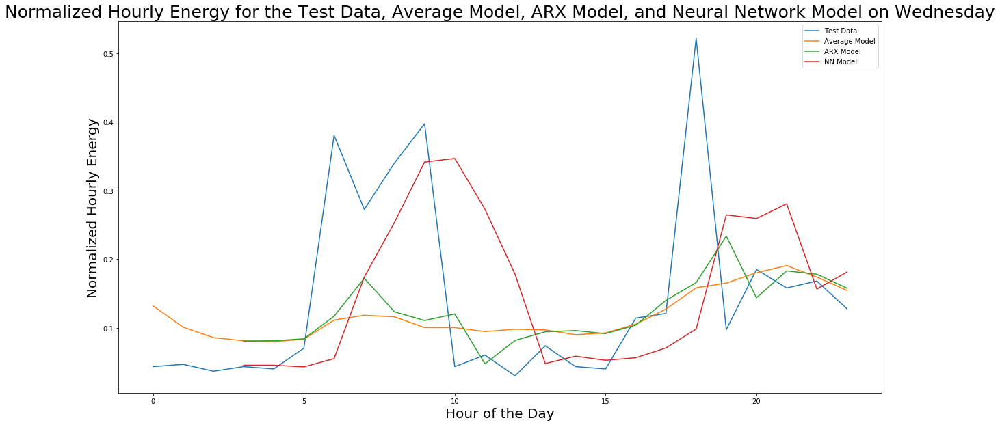

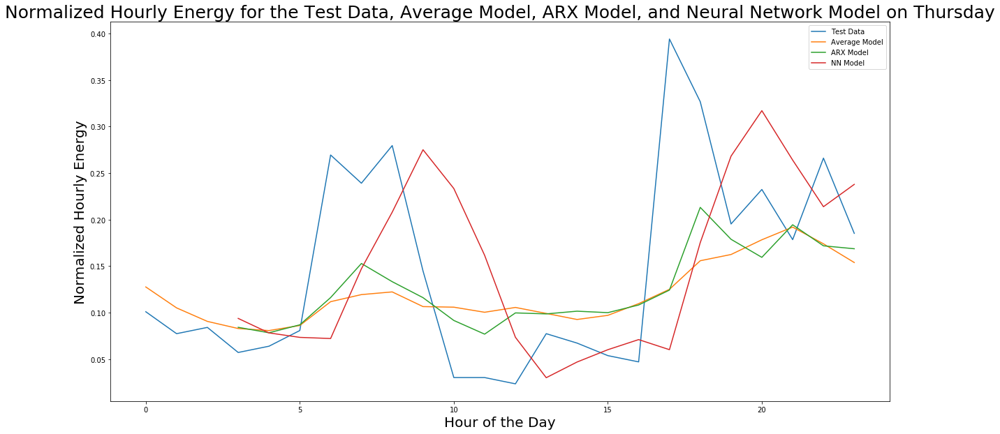

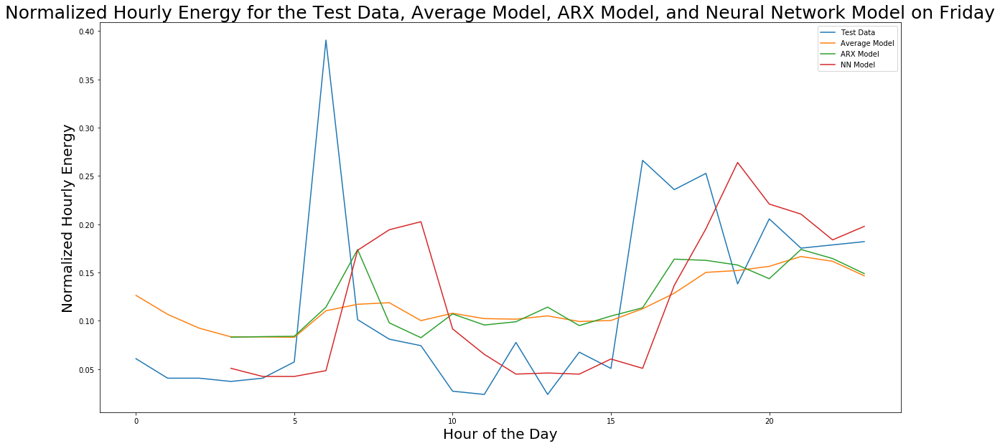

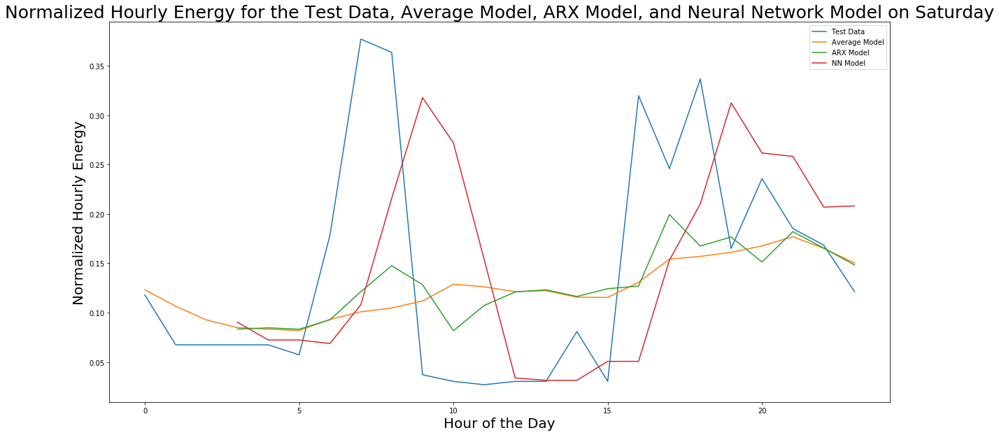

In [41]:
NN_MAE = []

for days in range(0,7):
    alpha = Days_list[days]
    df_1 = my_csv_test[ my_csv_test['Day'] == alpha]
    average = Average_hourly_energy_consumption[alpha].to_list()
    L = []
    M = []
    s = 0
    for hours in range(0,24):
        if hours >= 3:
            P1 = float(my_csv_test.loc[(my_csv_test['Hour'] == hours-1) & 
                                   (my_csv_test['Day'] == alpha), 'TestBldg'])
            P2 = float(my_csv_test.loc[(my_csv_test['Hour'] == hours-2) & 
                                   (my_csv_test['Day'] == alpha), 'TestBldg'])
            P3 = float(my_csv_test.loc[(my_csv_test['Hour'] == hours-3) & 
                                       (my_csv_test['Day'] == alpha), 'TestBldg'])
            P = float(my_csv_test.loc[(my_csv_test['Hour'] == hours) & 
                                      (my_csv_test['Day'] == alpha), 'TestBldg'])
            a = Alpha[0]*P1 + Alpha[1]*P2 + Alpha[2]*P3 + average[hours]
            L.append(a)
            n = np.tanh(W[0]*P1 + W[1]*P2 + W[2]*P3)
            M.append(n)
            s = s + abs(P-n)
    s = s/24
    NN_MAE.append(s)
    
    #Plot
    plt.figure(figsize=(20,10))
    plt.plot(df_1['Hour'].tolist(), df_1['TestBldg'].tolist(), label = 'Test Data')
    plt.plot(df_1['Hour'].tolist(), average, label='Average Model')
    plt.plot(df_1['Hour'].tolist()[3:24], L, label='ARX Model')
    plt.plot(df_1['Hour'].tolist()[3:24], M, label='NN Model')
    plt.xlabel('Hour of the Day', fontsize=20)
    plt.ylabel('Normalized Hourly Energy', fontsize=20)
    plt.legend()
    plt.title('Normalized Hourly Energy for the Test Data, Average Model, ARX Model, and Neural Network Model on '
              + alpha, fontsize=25)
    plt.show()

In [42]:
Results['NN MAE'] = NN_MAE
Results

,Day,Avg MAE,ARX MAE,NN MAE
0,Sunday,0.072869,0.065047,0.069558
1,Monday,0.108930,0.101673,0.132102
2,Tuesday,0.079239,0.071474,0.090971
3,Wednesday,0.084258,0.077112,0.094908
4,Thursday,0.067724,0.058664,0.077669
5,Friday,0.062153,0.053341,0.060389
6,Saturday,0.079013,0.070433,0.089710
